# Final Project Big Data
## New York City Taxi Fare Prediction 
  
Kaggle-Id: pondini

## Overview
1. [Installation & Imports](#1.-Installation-&-Imports)  
    1.1. [Install](#Install)  
    1.2. [Imports](#Imports)  
2. [Data Exploration and Cleaning](#2.-Data-Exploration-and-Cleaning)  
    2.1. [Client Creation](#Client-Creation)  
    2.2. [Read Data](#Read-Data)  
    2.3. [Exploration and Cleaning](#Exploration-and-Cleaning) 
3. [Build ML Model](#3.-Build-ML-Model)  
    3.1. [Linear Regression](#Linear-Regression)  
    3.2. [Random Forest](#Random-Forest)  
    3.3. [xgboost Regressor](#xgboost-Regressor)  
    3.4. [XGBRegressor ML Model](#XGBRegressor-ML-Model)  
    3.5. [Evaluation](#Evaluation)  
    3.6. [Submission File](#Submission-File)  
4. [Summary and Forecast](#4.-Summary-and-Forecast)
8. [Appendix](#5.-Appendix)  
    5.1 [Base Model](#5.1.-Base-Model)  
    5.2 [Remaining dask models](#5.2.-Remaining-dask-models)  
    5.3 [GPU Model (RAPIDS + DASK)](#5.3.-GPU-Parallelism-(RAPIDS+DASK))   
    5.4 [GPU Model (RAPIDS)](#5.4.-GPU-Parallelism-(Only-RAPIDS))
9. [Sources](#6.-Sources)

# 1. Installation & Imports 

## Install 
Install graphviz for xgb plots! If it can't be installed, don't execute the corresponding cells

In [1]:
#!conda install python-graphviz
#!pip install graphviz

## Imports 
Every import of a module that was used once during the project is listed here.  
It could be that modules are imported that are no longer used.

In [2]:
from dask.distributed import Client, wait, LocalCluster
from dask.delayed import delayed
import dask.dataframe as dd
import dask.array as da
import dask

from dask_cuda import LocalCUDACluster
from dask.utils import parse_bytes

import cudf
import dask_cudf

from dask_ml.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from dask_ml.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import explained_variance_score
from dask_ml.metrics import mean_squared_error

import pandas as pd
import numpy as np
import calendar
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('fivethirtyeight')

import PIL
import urllib

import joblib

import xgboost as xgb

## 2. Data Exploration and Cleaning 

### Client Creation 
Create a client and connect to the Dask Cluster.  
To use a local cluster, it's sufficient to specify only the "n_workers". It will automatically be passed to the Cluster constructor. 

In [ ]:
ip = ''

# Dask Cluster
client = Client(ip)

# If you want to use a local cluster
#client = Client(n_workers=4)

client

In [5]:
test_run=False

### Read Data

Just read parts of the data.  
(In this example run, only five million data were used due to simplicity and faster runtime.)

In [6]:
class DataLengthError(Exception):
    pass

In [7]:
test_run=True
n_rows=5000000
tmp = pd.read_csv('Data/train.csv', nrows=n_rows)

Read the whole data set if it's not a test run

In [8]:
if test_run:
    df = dd.from_pandas(tmp, npartitions=20)
else:
    df = dd.read_csv('Data/train.csv')

Check if the desired data is loaded. If not, raise an exception

In [9]:
len_data = len(df)

if test_run:
    if len_data != n_rows:
        raise DatgaLengthError('Could not load the entire File. Something went wrong.')
else:
    if len_data != 55423856:
        raise DatgaLengthError('Could not load the entire File. Something went wrong.')
        
print(len_data)

5000000


### Location
Plot pickup and dropoff laditude/longitude using only a part of the dataset for efficiency reasons and create a boundary box on the test dataset to filter out the outliers. 

In [10]:
plot_df = df.compute()

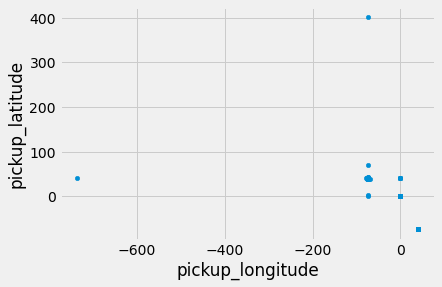

In [11]:
plot_df.iloc[:100000].plot.scatter('pickup_longitude', 'pickup_latitude')
plt.show()

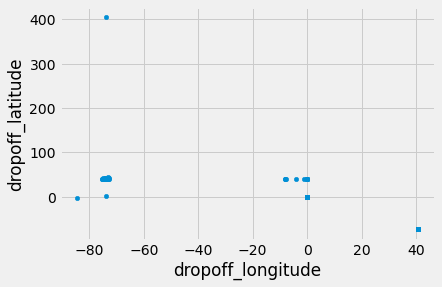

In [12]:
plot_df.iloc[:100000].plot.scatter('dropoff_longitude', 'dropoff_latitude')
plt.show()

There are a lot of outliers (values outside of nyc) or anomalies (values are not even real coordinates). To solve this, create a boundary box around new york city based on the test data. 

Read test data and create boundary box based on min and max latitude/longitude of the test data set

In [10]:
test = pd.read_csv('Data/test.csv')

In [11]:
min_lon = min(test.pickup_longitude.min(), test.dropoff_longitude.min())
min_lon

-74.263242

In [12]:
max_lon = max(test.pickup_longitude.max(), test.dropoff_longitude.max())
max_lon

-72.986532

In [13]:
min_lat = min(test.pickup_latitude.min(), test.dropoff_latitude.min())
min_lat

40.568973

In [14]:
max_lat = max(test.pickup_latitude.max(), test.dropoff_latitude.max())
max_lat

41.709555

In [15]:
del test

In [16]:
boundary = {'min_lon': min_lon, 'max_lon': max_lon, 'min_lat': min_lat, 'max_lat': max_lat}
boundary

{'min_lon': -74.263242,
 'max_lon': -72.986532,
 'min_lat': 40.568973,
 'max_lat': 41.709555}

The outliers/anomalies will be cleared later. First start to explore the data. The boundary box will be necessary later. 

## Exploration and Cleaning 
\[[1](https://www.kaggle.com/breemen/nyc-taxi-fare-data-exploration)\]
\[[2](https://www.kaggle.com/willkoehrsen/a-walkthrough-and-a-challenge)\]
\[[3](https://www.kaggle.com/dster/nyc-taxi-fare-starter-kernel-simple-linear-model)\]
\[[4](https://www.kaggle.com/shaz13/simple-exploration-notebook-map-plots-v2)\]

Create a pandas dataframe for faster plotting

In [17]:
plot_df = df.compute()

In [18]:
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


Check for NaN in the dataset

In [19]:
df.isnull().sum().compute()

key                   0
fare_amount           0
pickup_datetime       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude    36
dropoff_latitude     36
passenger_count       0
dtype: int64

Remove them

In [20]:
df=df.dropna()

Check datatypes and parse them 

In [21]:
df.dtypes

key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

In [22]:
df['key'] = df['key'].astype('datetime64[ns]')
df['fare_amount'] = df['fare_amount'].astype('float32')
df['pickup_datetime'] = df['pickup_datetime'].astype('datetime64[ns]')
df['pickup_longitude'] = df['pickup_longitude'].astype('float32')
df['pickup_latitude'] = df['pickup_latitude'].astype('float32')
df['dropoff_longitude'] = df['dropoff_longitude'].astype('float32')
df['dropoff_latitude'] = df['dropoff_latitude'].astype('float32')
df['passenger_count'] = df['passenger_count'].astype('int8')

Use describe function to get a summary statistic of the data. With the summary there could be found some outliers and anomalies.  
For example the minimum fare amount or minimum passenger count are negative. 

In [23]:
df.describe().compute()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,4.999964e+06,4.999964e+06,4.999964e+06,4.999964e+06,4.999964e+06,4.999964e+06
mean,1.134074e+01,-7.250681e+01,3.991976e+01,-7.250652e+01,3.991726e+01,1.684297e+00
std,9.820065e+00,1.280962e+01,8.963488e+00,1.284777e+01,9.486767e+00,1.310633e+00
min,-1.000000e+02,-3.426609e+03,-3.488080e+03,-3.412653e+03,-3.488080e+03,-1.270000e+02
25%,6.000000e+00,-7.399197e+01,4.073513e+01,-7.399133e+01,4.073422e+01,1.000000e+00
50%,8.500000e+00,-7.398170e+01,4.075277e+01,-7.398007e+01,4.075338e+01,1.000000e+00
75%,1.250000e+01,-7.396686e+01,4.076728e+01,-7.396345e+01,4.076820e+01,2.000000e+00
max,1.273310e+03,3.439426e+03,3.310365e+03,3.457622e+03,3.345917e+03,5.100000e+01


### Fare Amount
First, explore the data with fare amount

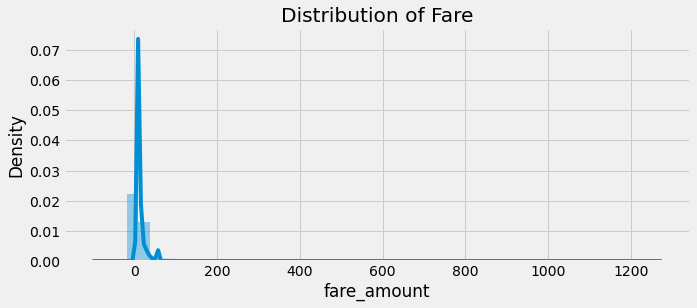

In [24]:
plt.figure(figsize=(10,4))
sns.distplot(plot_df['fare_amount'])
plt.title('Distribution of Fare')
plt.show()

The highest density is around ~\\$20.  
To get a better overview, show the numbers of negative fare amount rides, \\$0 fare rides and of the amount between \\$0 and \\$2.50 rides.

In [25]:
print(f"There are {len(plot_df[plot_df['fare_amount'] < 0])} negative fares.")
print(f"There are {len(plot_df[plot_df['fare_amount'] == 0])} $0 fares.")
print(f"There are {len(plot_df[plot_df['fare_amount'].between(0, 2.49)])} fares between $0 and $2.50.")

There are 211 negative fares.
There are 132 $0 fares.
There are 199 fares between $0 and $2.50.


In New York City is the minimum fare amount \\$2.50, so all rides with a smaller fare than \\$2.50 are outliers/anomalies and can be dropped.    
Drop all rows where fare amount is smaller than \\$2.50 \[[5](https://www.introducingnewyork.com/taxis#:~:text=Minimum%20fare%3A%20US%24%202.50.,City%20taxes%3A%20US%24%200.50)\]
  

In [26]:
df=df[df.fare_amount>=2.5]

Show the fare amount in a histogram from \\$2.50 to \\$100. 

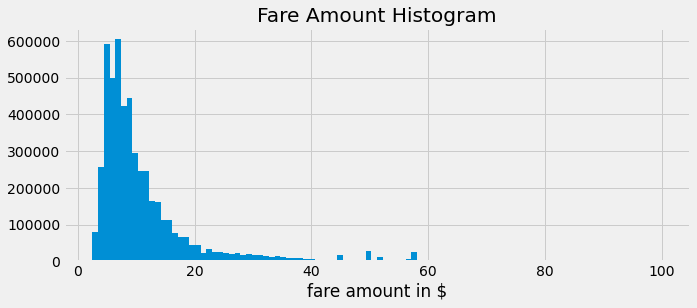

In [27]:
plot_df[plot_df.fare_amount.between(2.50, 100)].fare_amount.hist(bins=100, figsize=(10,4))
plt.xlabel('fare amount in $')
plt.title('Fare Amount Histogram')
plt.show()

There are also some really high fares.

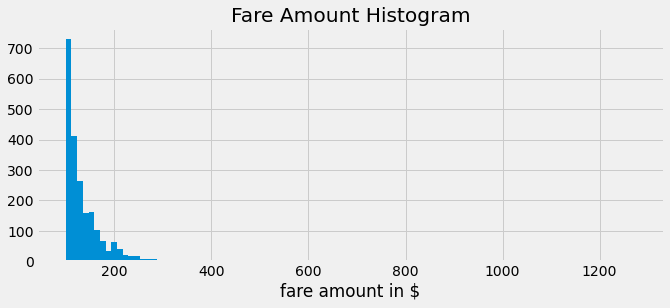

In [28]:
plot_df[plot_df.fare_amount >= 100].fare_amount.hist(bins=100, figsize=(10,4))
plt.xlabel('fare amount in $')
plt.title('Fare Amount Histogram')
plt.show()

Now bin the fare amounts to have show where is the highest distribution. 

In [29]:
plot_df['fare-bin']=pd.cut(plot_df['fare_amount'], bins=list(range(0,50,5))).astype("str")

plot_df.loc[plot_df['fare-bin'] == 'nan', 'fare-bin'] = '[45+]'

plot_df.loc[plot_df['fare-bin'] == '(5, 10]', 'fare-bin'] = '(05, 10]'

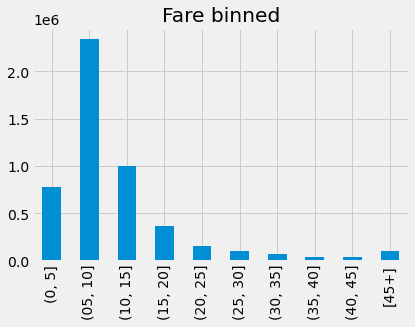

In [30]:
plot_df['fare-bin'].value_counts().sort_index().plot.bar()
plt.title('Fare binned')
plt.show()

### Empirical Cumulative Distribution Function 
Shows the percentile of the variable. \[[2](https://www.kaggle.com/willkoehrsen/a-walkthrough-and-a-challenge)\]

In [31]:
def ecdf(x):
    """Empirical cumulative distribution function of a variable"""
    # Sort in ascending order
    x = np.sort(x)
    n = len(x)
    
    # Go from 1/n to 1
    y = np.arange(1, n + 1, 1) / n
    
    return x, y

The Empirical Cumulative Distribution Function shows more than 80% of the fares are under 20$. 

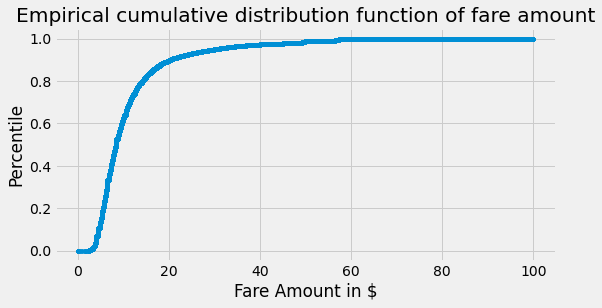

In [32]:
xs, ys = ecdf(plot_df[plot_df['fare_amount'].between(0,100)].fare_amount)
plt.figure(figsize=(8,4))
plt.plot(xs, ys, '.')
plt.ylabel('Percentile')
plt.xlabel('Fare Amount in $')
plt.title('Empirical cumulative distribution function of fare amount')
plt.show()

### Passenger Count

Plot the passenger count.

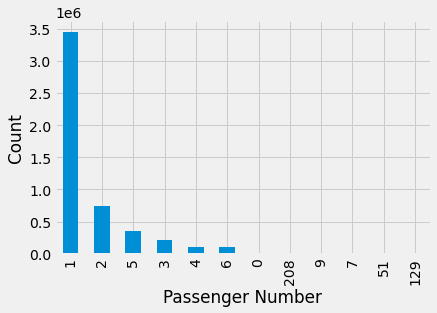

In [33]:
plot_df['passenger_count'].value_counts().plot.bar()
plt.ylabel('Count')
plt.xlabel('Passenger Number')
plt.show()

There are some negative numbers of passenger and some very high  numbers of passenger. Remove all over 8 and under 0 values

In [34]:
df=df[df.passenger_count.between(0,8)]

### Boundary Box

Use the created boundary box above and remove the pickup and dropoff places outside this box

In [35]:
df=df[((df.pickup_longitude >= boundary['min_lon'] ) & (df.pickup_longitude <= boundary['max_lon']) &
            (df.pickup_latitude >= boundary['min_lat']) & (df.pickup_latitude <= boundary['max_lat']) &
            (df.dropoff_longitude >= boundary['min_lon']) & (df.dropoff_longitude <= boundary['max_lon']) &
            (df.dropoff_latitude >=boundary['min_lat']) & (df.dropoff_latitude <= boundary['max_lat']))]

Apply the changes

In [36]:
plot_df=df.compute()
df=dd.from_pandas(plot_df, npartitions=20)

### Plot Location

Maps are extracted from OpenStreetMap [6](https://www.openstreetmap.org/export#map=12/40.7250/-73.8999) and found on [7](https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png) [8](https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png)

In [37]:
# load image of NYC map
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = PIL.Image.open(urllib.request.urlopen('https://raw.githubusercontent.com/pondini/BigData21/main/Project/images/nyc_-74.5_-72.8_40.5_41.8.png'))

# load extra image to zoom in on NYC
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = PIL.Image.open(urllib.request.urlopen('https://raw.githubusercontent.com/pondini/BigData21/main/Project/images/nyc_-74.3_-73.7_40.5_40.9.png'))

In [38]:
def plot_on_map(pdf, BB, nyc, s=1, alpha=0.2):
    fix, axis = plt.subplots(1, 2, figsize=(16,10))
    axis[0].scatter(pdf.pickup_longitude, pdf.pickup_latitude, zorder=1, alpha=alpha, color='r', s=s)
    axis[0].set_xlim((BB[0], BB[1]))
    axis[0].set_ylim((BB[2], BB[3]))
    axis[0].set_title('Pickup locations')
    axis[0].imshow(nyc, zorder=0, extent=BB)
    
    axis[1].scatter(pdf.dropoff_longitude, pdf.dropoff_latitude, zorder=1, alpha=alpha, color='b', s=s)
    axis[1].set_xlim((BB[0], BB[1]))
    axis[1].set_ylim((BB[2], BB[3]))
    axis[1].set_title('Dropoff locations')
    axis[1].imshow(nyc, zorder=0, extent=BB)

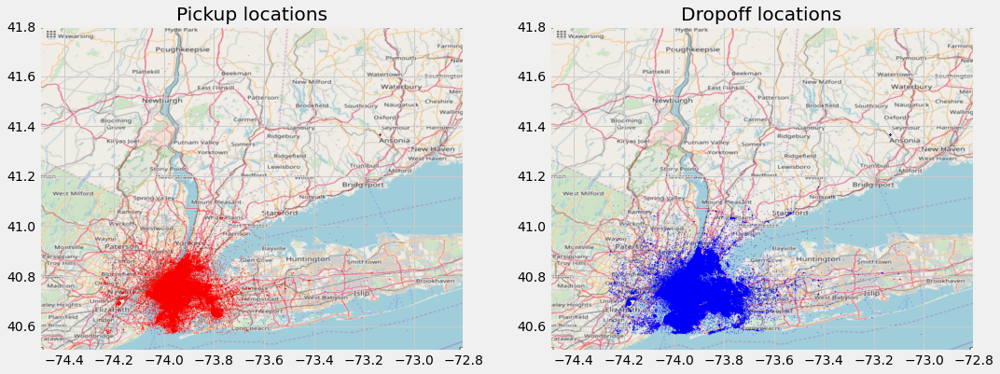

In [39]:
plot_on_map(plot_df, BB, nyc_map)

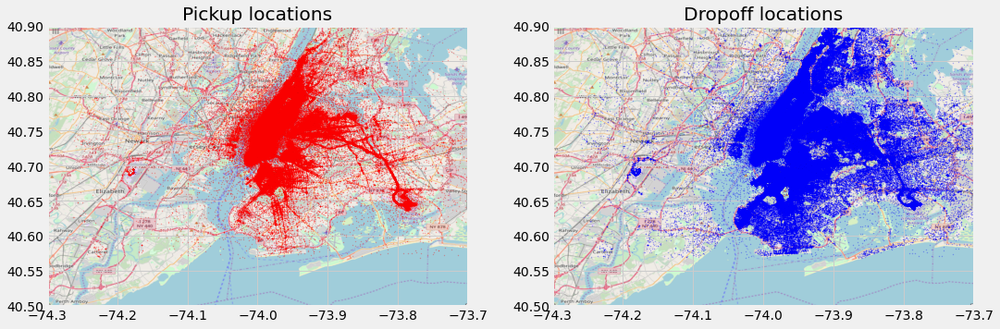

In [40]:
plot_on_map(plot_df, BB_zoom, nyc_map_zoom)

In [41]:
def plot_without_map(pdf, BB, figsize=(12, 5), c=('r', 'b'), split=True, alpha=0.2, s=0.1):
    if split:
        fig, axis = plt.subplots(1,2, figsize=figsize)
        
        axis[0].scatter(pdf.pickup_longitude, pdf.pickup_latitude, alpha=alpha, c=c[0], s=s)
        axis[0].set_title('Pickups')
        axis[0].set_xlim((BB[0], BB[1]))
        axis[0].set_ylim((BB[2], BB[3]))
        
        axis[1].scatter(pdf.dropoff_longitude, pdf.dropoff_latitude, alpha=alpha, c=c[1], s=s)
        axis[1].set_title('Dropoffs')
        axis[1].set_xlim((BB[0], BB[1]))
        axis[1].set_ylim((BB[2], BB[3]))
        
        
    else:
        fig, axis = plt.subplots(1,1, figsize=figsize)
        axis.scatter(pdf.pickup_longitude, pdf.pickup_latitude, alpha=alpha, c=c[0], s=s)
        axis.scatter(pdf.dropoff_longitude, pdf.dropoff_latitude, alpha=alpha, c=c[1], s=s)
        axis.set_xlim((BB[0], BB[1]))
        axis.set_ylim((BB[2], BB[3]))
        axis.set_title('Pickups (red) and Dropoffs (blue)')

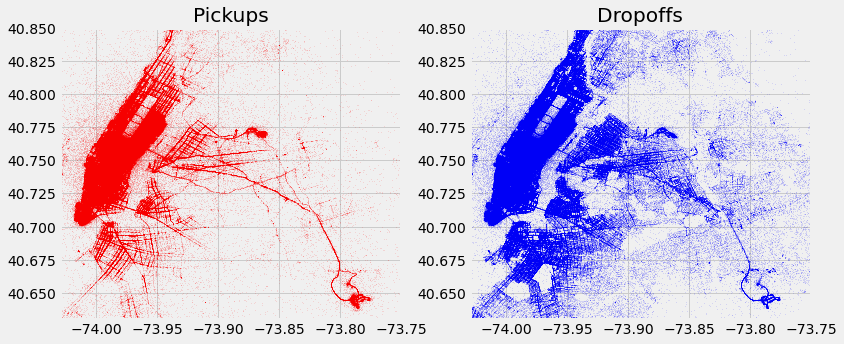

In [42]:
plot_without_map(plot_df, (-74.03, -73.75, 40.63, 40.85), split=True)

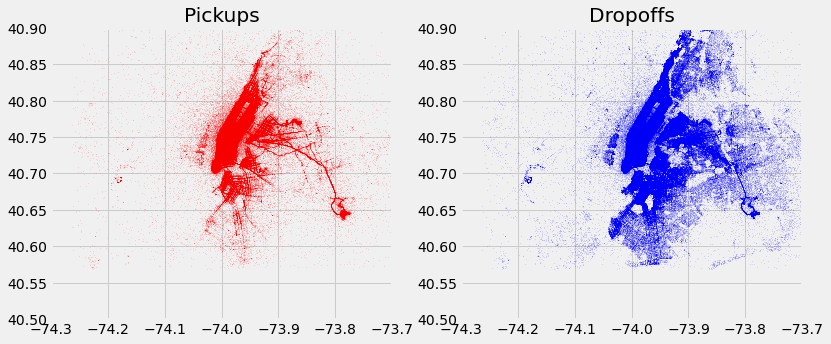

In [43]:
plot_without_map(plot_df, BB_zoom, split=True)

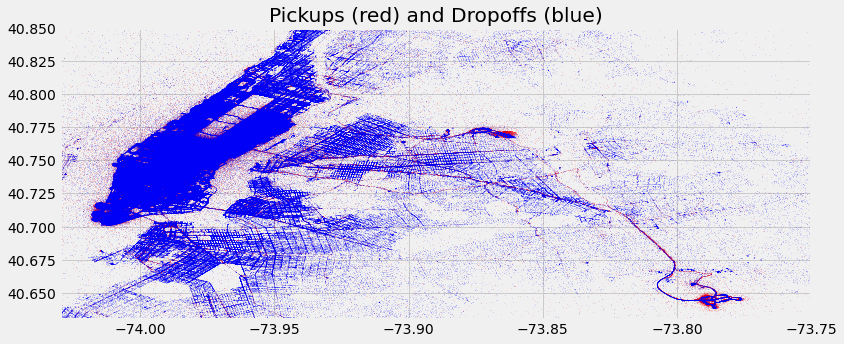

In [44]:
plot_without_map(plot_df, (-74.03, -73.75, 40.63, 40.85), split=False)

Plot binned fare amount on map.  
Binned sections are in steprange of five and are shown below

In [45]:
palette = sns.color_palette('Paired', 10)
plot_df['fare-bin']=pd.cut(plot_df['fare_amount'], bins=list(range(0,50,5))).astype("str")

plot_df.loc[plot_df['fare-bin'] == 'nan', 'fare-bin'] = '[45+]'

plot_df.loc[plot_df['fare-bin'] == '(5, 10]', 'fare-bin'] = '(05, 10]'

color_mapping={fare_bin: palette[i] for i, fare_bin in enumerate(plot_df['fare-bin'].unique())}

In [46]:
plot_df['color']=plot_df['fare-bin'].map(color_mapping)

In [47]:
def plot_color_map(pdf, nyc, BB):
    fig, axis=plt.subplots(2, 1, figsize=(40,36))
    for b, gdf in pdf.groupby('fare-bin'):
        axis[0].scatter(gdf.pickup_longitude, gdf.pickup_latitude, zorder=1, alpha=0.2, c=gdf.color, s=10, label=f'{b}')
        axis[0].set_xlim((BB[0], BB[1]))
        axis[0].set_ylim((BB[2], BB[3]))
        axis[0].set_title('Pickup locations', size=32)
        axis[0].axis('off')
    
    leg = axis[0].legend(fontsize=28, markerscale=3)
    for lh in leg.legendHandles:
        lh.set_alpha(1)
    
    leg.set_title('Fare Bin', prop={'size':28})
    
    axis[0].imshow(nyc, zorder=0, extent=BB)
    
    for b, gdf in pdf.groupby('fare-bin'):
        axis[1].scatter(gdf.dropoff_longitude, gdf.dropoff_latitude, zorder=1, alpha=0.2, c=gdf.color, s=10, label=f'{b}')
        axis[1].set_xlim((BB[0], BB[1]))
        axis[1].set_ylim((BB[2], BB[3]))
        axis[1].set_title('Dropoff locations', size=32)
        axis[1].axis('off')
    
    leg = axis[1].legend(fontsize=28, markerscale=3)
    for lh in leg.legendHandles:
        lh.set_alpha(1)
    
    leg.set_title('Fare Bin', prop={'size':28})
    
    axis[1].imshow(nyc, zorder=0, extent=BB)

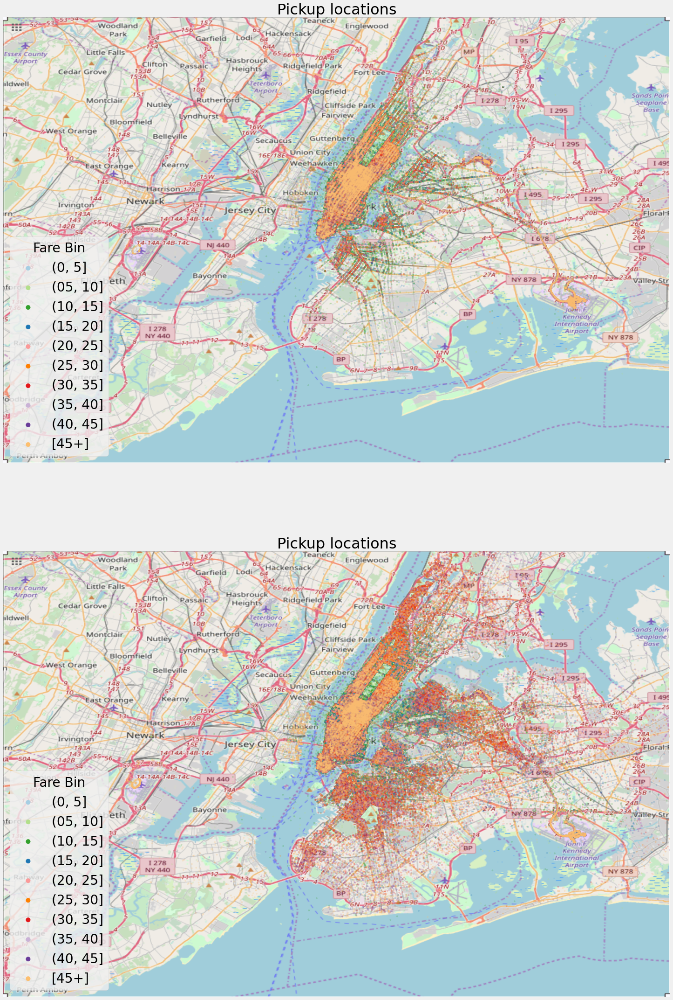

In [48]:
plot_color_map(plot_df.sample(1_500_000, random_state=123), nyc_map_zoom, BB_zoom)

### Add some extra features


#### Haversine Distance \[[2](https://www.kaggle.com/willkoehrsen/a-walkthrough-and-a-challenge#Calculate-Distance-between-points-using-Haversine-distance)\] \[[9](https://www.kite.com/python/answers/how-to-find-the-distance-between-two-lat-long-coordinates-in-python)\]
Calculates the distance in miles between locations in longitute and latitude coordinates

In [49]:
EARTH_RADIUS_IN_KM = 6371
KM_TO_MILES = 0.621371

# JFK airport coordinates, see https://www.travelmath.com/airport/JFK
JFK = {'lon': -73.7822222222, 'lat': 40.6441666667}

# Newark Liberty International Airport, see https://www.travelmath.com/airport/EWR
EWR = {'lon': -74.175, 'lat': 40.6897222222}

# LaGuardia Airport, see https://www.travelmath.com/airport/LGA
LGA = {'lon': -73.8719444444, 'lat': 40.7747222222}

# New York City Center, see https://www.travelmath.com/cities/New+York,+NY
NYC = {'lon': -74.006076, 'lat': 40.711967}

### Haversine Distance

In [50]:
def haversine_distance(lon1, lat1, lon2, lat2):
    
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to miles
    miles = KM_TO_MILES * EARTH_RADIUS_IN_KM * c
    
    return miles

### Minkowski Distance
If p = 1 it's the manhattan distance. And if p = 2 it's the euclidean distance.  
Read more: [Minkowski Distance](https://en.wikipedia.org/wiki/Minkowski_distance)

In [51]:
def minkowski_distance(lon1, lon2, lat1, lat2, p):
    return ((abs(lon2 - lon1) ** p) + (abs(lat2 - lat1)) ** p) ** (1 / p)

def manhattan_distance(lon1, lon2, lat1, lat2):
    return minkowski_distance(lon1, lon2, lat1, lat2, 1)

def euclidean_distance(lon1, lon2, lat1, lat2):
    return minkowski_distance(lon1, lon2, lat1, lat2, 2)

Add some features from the datetime object and add some basic distance features.

In [52]:
def add_features(df):
    df_copy = df.copy()
    
    df_copy['date'] = df_copy['pickup_datetime'].dt.date
    df_copy['hour'] = df_copy['pickup_datetime'].dt.hour
    df_copy['year'] = df_copy['pickup_datetime'].dt.year
    df_copy['month'] = df_copy['pickup_datetime'].dt.month
    df_copy['day'] = df_copy['pickup_datetime'].dt.day
    df_copy['weekday'] = df_copy['pickup_datetime'].dt.weekday
    df_copy['weekday_name'] = df_copy['pickup_datetime'].apply(lambda x: calendar.day_name[x.weekday()])
    
    # manhattan distance
    df_copy['manhattan_dist'] = manhattan_distance(df_copy['pickup_longitude'], df_copy['dropoff_longitude'], 
                                                   df_copy['pickup_latitude'], df_copy['dropoff_latitude'])
    
    # euclidean distance
    df_copy['euclidean_dist'] = euclidean_distance(df_copy['pickup_longitude'], df_copy['dropoff_longitude'], 
                                                   df_copy['pickup_latitude'], df_copy['dropoff_latitude'])
    
    # manhattan vector
    df_copy['abs_diff_longitude'] = (df_copy['dropoff_longitude'] - df_copy['pickup_longitude']).abs()
    df_copy['abs_diff_latitude'] = (df_copy['dropoff_latitude'] - df_copy['pickup_latitude']).abs()
    
    # distance between pickup location and dropoff location
    df_copy['haversine_dist'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], df_copy['dropoff_longitude'], df_copy['dropoff_latitude'])
    
    # distance to jfk
    df_copy['pick_dist_to_jfk'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], JFK['lon'], JFK['lat'])
    df_copy['drop_dist_to_jfk'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], JFK['lon'], JFK['lat'])
    
    # distance to EWR
    df_copy['pick_dist_to_ewr'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], EWR['lon'], EWR['lat'])
    df_copy['drop_dist_to_ewr'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], EWR['lon'], EWR['lat'])
    
    # distance to EWR
    df_copy['pick_dist_to_lga'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], LGA['lon'], LGA['lat'])
    df_copy['drop_dist_to_lga'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], LGA['lon'], LGA['lat'])
    
    return df_copy

In [53]:
df=add_features(df)

In [54]:
plot_df=df.compute()
df=dd.from_pandas(plot_df, npartitions=20)

Show the Manhattan Distance by the amount of the fare and compare it with the Euclidean Distance by the amount of the fare.

In [55]:
palette = sns.color_palette('Paired', 10)
plot_df['fare-bin']=pd.cut(plot_df['fare_amount'], bins=list(range(0,50,5))).astype("str")

plot_df.loc[plot_df['fare-bin'] == 'nan', 'fare-bin'] = '[45+]'

plot_df.loc[plot_df['fare-bin'] == '(5, 10]', 'fare-bin'] = '(05, 10]'

color_mapping={fare_bin: palette[i] for i, fare_bin in enumerate(plot_df['fare-bin'].unique())}

plot_df['color']=plot_df['fare-bin'].map(color_mapping)

In [56]:
def plot_distance(name):
    plt.figure(figsize = (12, 6))
    for f, grouped in plot_df.groupby('fare-bin'):
        sns.kdeplot(grouped[name + '_dist'], label = f'{f}', color = list(grouped['color'])[0]);

    plt.xlabel('degrees')
    plt.ylabel('density')
    plt.legend()
    plt.title(f'{name} Distance by Fare Amount')

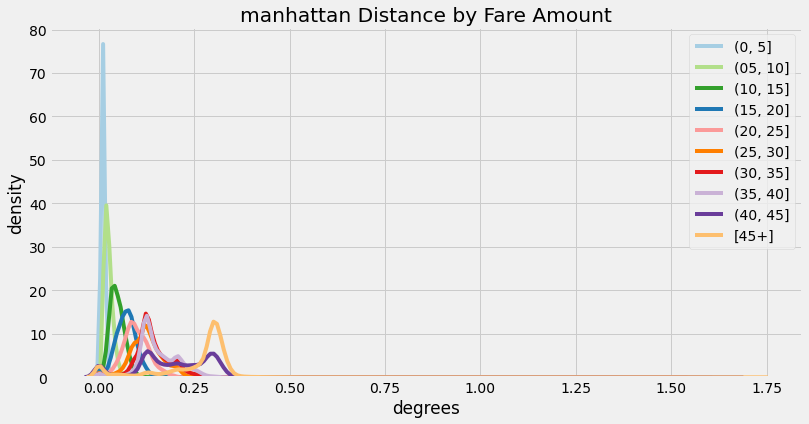

In [57]:
plot_distance('manhattan')

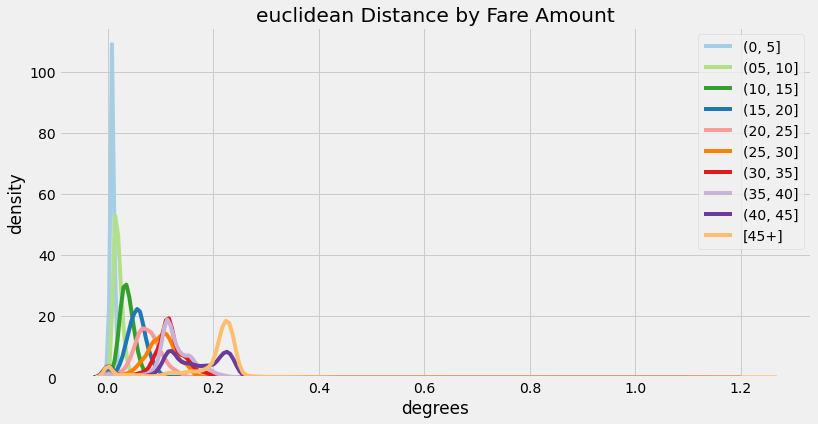

In [58]:
plot_distance('euclidean')

Now have a look at the ride distances in miles. Plot it in a histogram and show the describtions. 

count    4.892486e+06
mean     2.065923e+00
std      2.337333e+00
min      0.000000e+00
25%      7.787309e-01
50%      1.337070e+00
75%      2.428549e+00
max      7.182804e+01
Name: haversine_dist, dtype: float64

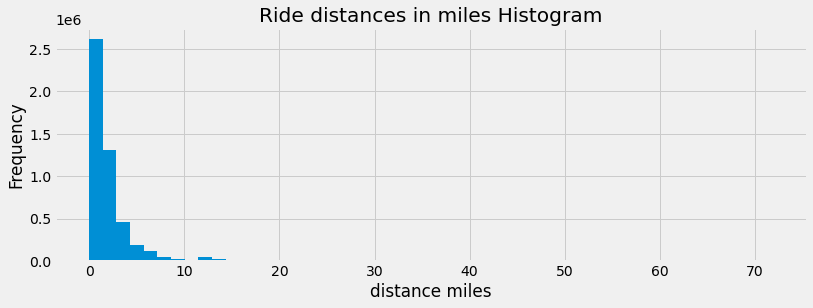

In [59]:
plot_df.haversine_dist.plot.hist(bins=50, figsize=(12,4))
plt.xlabel('distance miles')
plt.title('Ride distances in miles Histogram')
plot_df.haversine_dist.describe()

Use the kdeplot aswell to have a different view on the data.

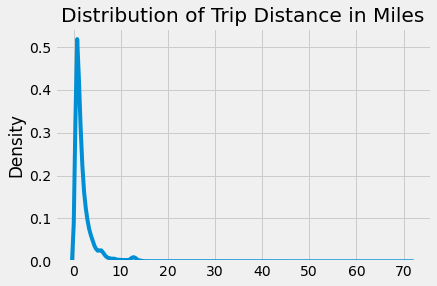

In [60]:
sns.kdeplot((plot_df.haversine_dist.values))
plt.title('Distribution of Trip Distance in Miles')
plt.show()

Check the influence of passenger count 

In [61]:
plot_df.groupby('passenger_count')['haversine_dist', 'fare_amount'].mean()

,haversine_dist,fare_amount
passenger_count,,
0,1.762610,8.946533
1,2.036125,11.181088
2,2.179324,11.794892
3,2.108464,11.545926
4,2.141832,11.756031
5,2.071181,11.192719
6,2.116016,12.139978
7,1.008460,8.500000


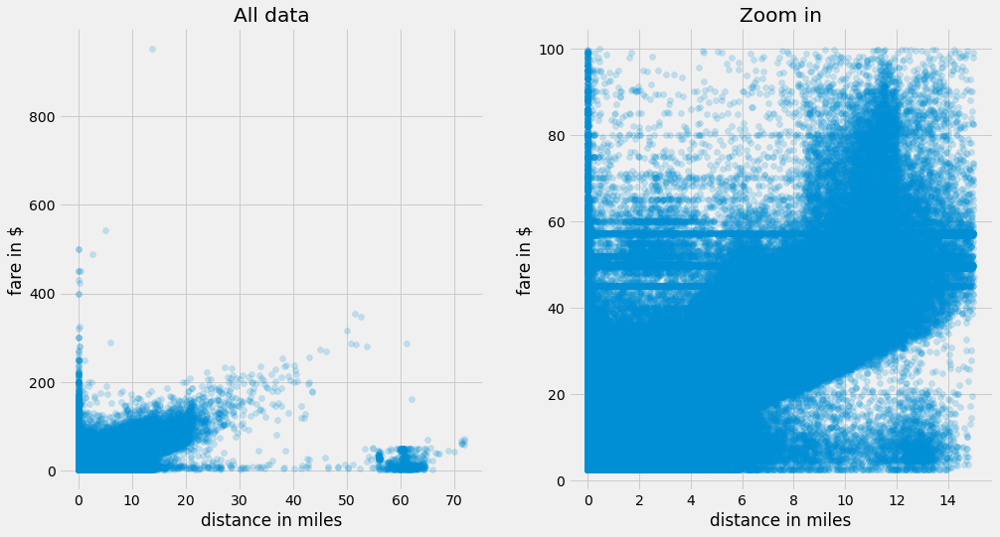

In [62]:
fig, axis = plt.subplots(1, 2, figsize=(15, 8))
axis[0].scatter(plot_df.haversine_dist, plot_df.fare_amount, alpha=0.2)
axis[0].set_xlabel('distance in miles')
axis[0].set_ylabel('fare in $')
axis[0].set_title('All data')

axis[1].scatter(plot_df[(plot_df.haversine_dist < 15) & (plot_df.fare_amount < 100)].haversine_dist, plot_df[(plot_df.haversine_dist < 15) & (plot_df.fare_amount < 100)].fare_amount, alpha=0.2)
axis[1].set_xlabel('distance in miles')
axis[1].set_ylabel('fare in $')
axis[1].set_title('Zoom in')

plt.show()

- There are trips with 0 distance but have a high fare? -> Trips from and to the same location? 
- There are some trips with > 50 miles distance but have a low fare? -> fixed fees? e.g. a trip from/to an airport?
- Calculate Average \$/Mile?

In [63]:
plot_df.fare_amount.sum()/plot_df.haversine_dist.sum()

5.476153

Plot the Correlation between Fare Amount and Trip Distance

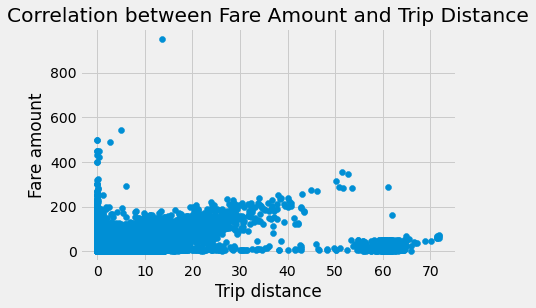

In [64]:
plt.scatter(plot_df.haversine_dist, plot_df.fare_amount)
plt.xlabel('Trip distance')
plt.ylabel('Fare amount')
plt.title('Correlation between Fare Amount and Trip Distance')
plt.show()

### Fixed fees
Check if there are fixed fees for Trips like from/to Airport

In [65]:
def plot_location_fare(pdf, loc, name, range_around=1.5):
    fig, axis=plt.subplots(1,2, figsize=(15, 7))
    
    pdf[haversine_distance(pdf.pickup_latitude, pdf.pickup_longitude, loc['lat'], loc['lon']) < range_around].fare_amount.hist(bins=100, ax=axis[0])
    axis[0].set_xlabel('fare in $')
    axis[0].set_title('Histogram pickup location within {} miles of {}'.format(range_around, name), size=10)
    
    pdf[haversine_distance(pdf.dropoff_latitude, pdf.dropoff_longitude, loc['lat'], loc['lon']) < range_around].fare_amount.hist(bins=100, ax=axis[1])
    axis[1].set_xlabel('fare in $')
    axis[1].set_title('Histogram dropff location within {} miles of {}'.format(range_around, name), size=10)

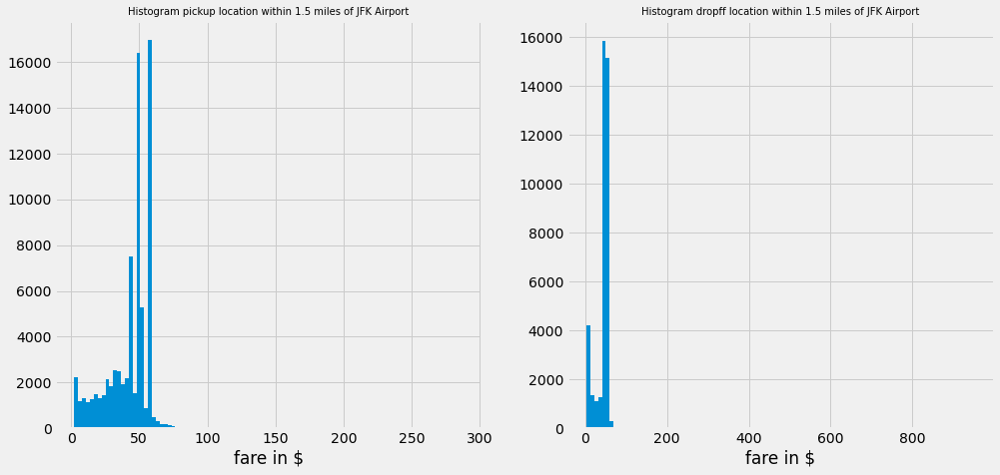

In [66]:
plot_location_fare(plot_df, JFK, 'JFK Airport')

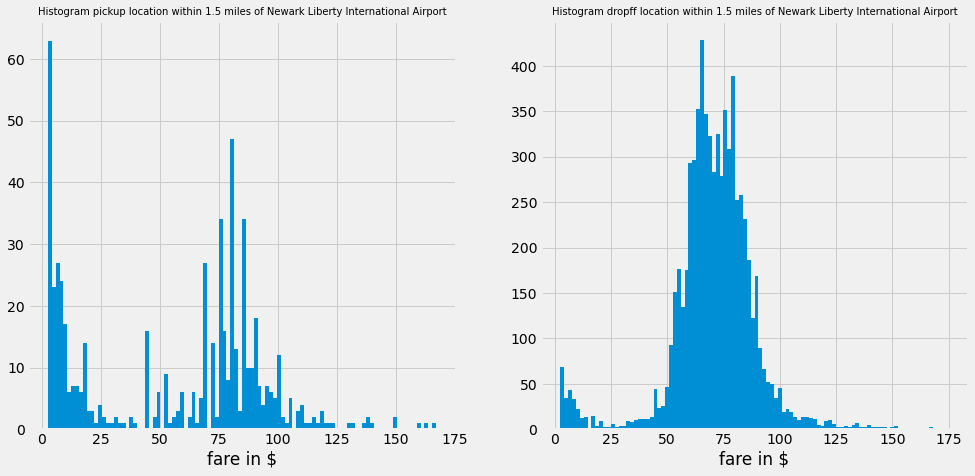

In [67]:
plot_location_fare(plot_df, EWR, 'Newark Liberty International Airport')

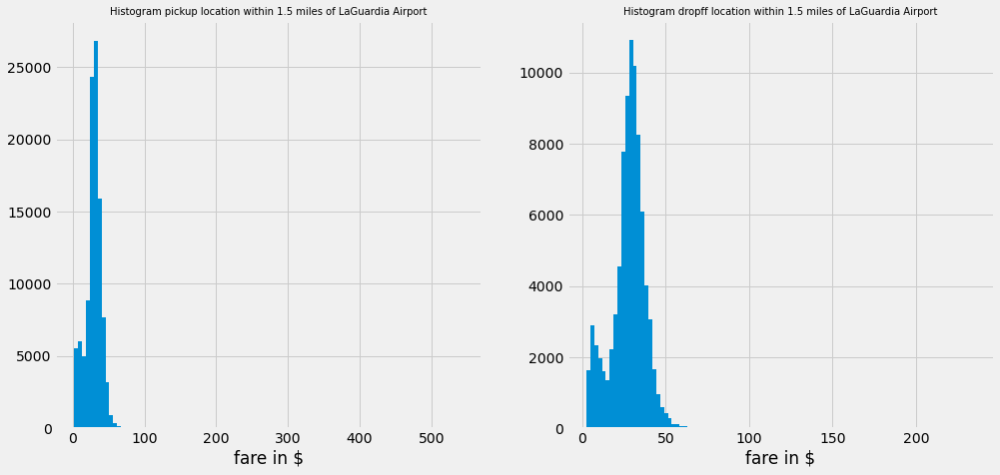

In [68]:
plot_location_fare(plot_df, LGA, 'LaGuardia Airport')

Looks kinda there are some fixed prices. But some people paid a way to much? Like >900 dollars for one ~13 miles ride?

In [69]:
highest_price_to_jfk = plot_df[max(max(plot_df[haversine_distance(plot_df.pickup_latitude, plot_df.pickup_longitude, JFK['lat'], JFK['lon']) < 1.5].fare_amount), max(plot_df[haversine_distance(plot_df.dropoff_latitude, plot_df.dropoff_longitude, JFK['lat'], JFK['lon']) < 1.5].fare_amount)) == plot_df.fare_amount]

In [70]:
def plot_ride_on_map(pdf, BB, nyc, s=1, alpha=0.2):
    fix, axis = plt.subplots(1, 1, figsize=(10,6))
    axis.scatter(pdf.pickup_longitude, pdf.pickup_latitude, zorder=1, alpha=alpha, color='r', s=s, label='Pickup')
    axis.scatter(pdf.dropoff_longitude, pdf.dropoff_latitude, zorder=1, alpha=alpha, color='b', s=s, label='Dropoff')
    axis.set_xlim((BB[0], BB[1]))
    axis.set_ylim((BB[2], BB[3]))
    axis.set_title(f'Single ride with {pdf.fare_amount.values[0]} $ Fare Amount')
    axis.legend()
    axis.imshow(nyc, zorder=0, extent=BB)

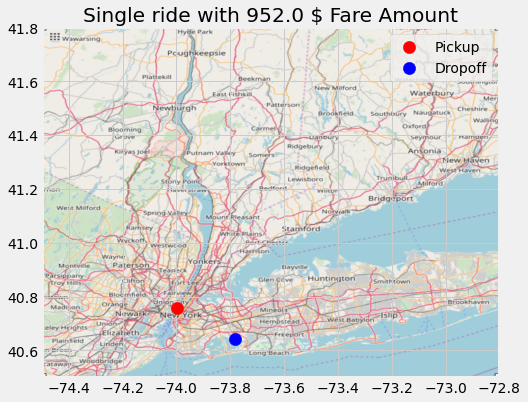

In [71]:
plot_ride_on_map(highest_price_to_jfk, BB, nyc_map, s=150, alpha=1)

### Variation of fare related to pickup location

In [72]:
df['distance_to_center']=haversine_distance(NYC['lat'], NYC['lon'], df.pickup_latitude, df.pickup_longitude)

In [73]:
plot_df=df.compute()
df=dd.from_pandas(plot_df, npartitions=20)

Plot distance to center in relation to trip distance by using the fare amount aswell. 

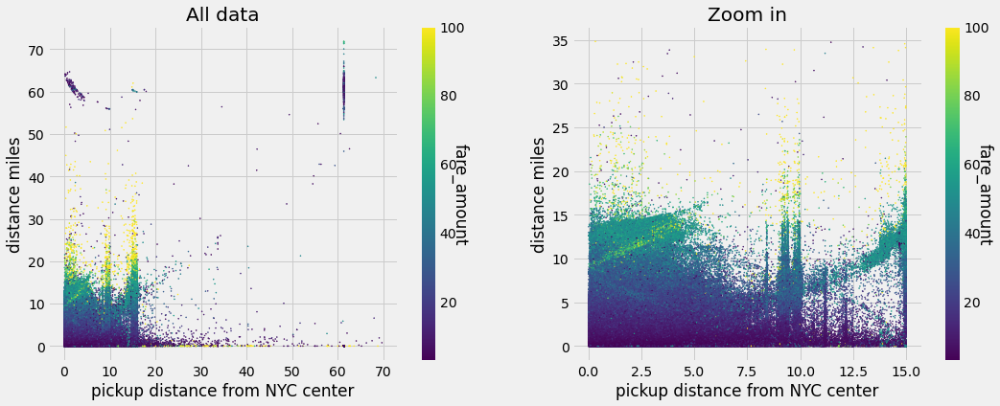

In [74]:
fig, axis = plt.subplots(1, 2, figsize=(16,6))
im = axis[0].scatter(plot_df.distance_to_center, plot_df.haversine_dist, c=np.clip(plot_df.fare_amount, 0, 100), 
                     cmap='viridis', alpha=1.0, s=1)
axis[0].set_xlabel('pickup distance from NYC center')
axis[0].set_ylabel('distance miles')
axis[0].set_title('All data')
cbar = fig.colorbar(im, ax=axis[0])
cbar.ax.set_ylabel('fare_amount', rotation=270)

idx = (plot_df.distance_to_center < 15) & (plot_df.haversine_dist < 35)
im = axis[1].scatter(plot_df[idx].distance_to_center, plot_df[idx].haversine_dist, 
                     c=np.clip(plot_df[idx].fare_amount, 0, 100), cmap='viridis', alpha=1.0, s=1)
axis[1].set_xlabel('pickup distance from NYC center')
axis[1].set_ylabel('distance miles')
axis[1].set_title('Zoom in')
cbar = fig.colorbar(im, ax=axis[1])
cbar.ax.set_ylabel('fare_amount', rotation=270)

plt.show()

Now try to remove all airport pickups and dropoffs to find a more 'linear' view of the data. 

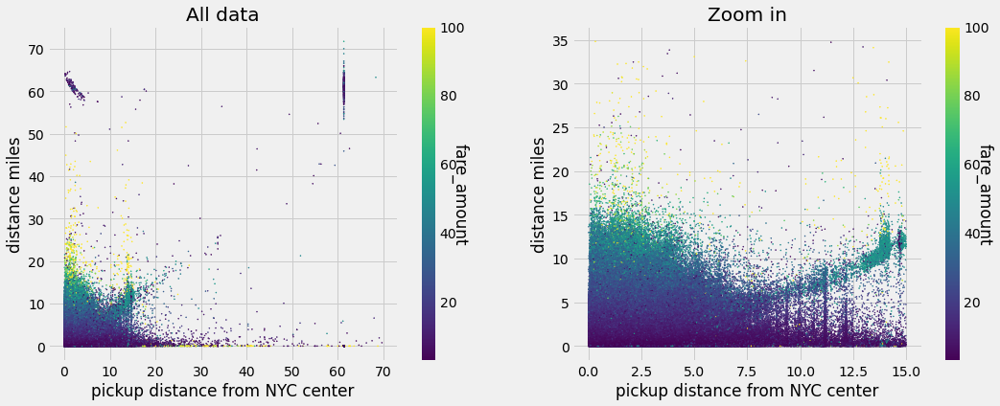

In [75]:
plot_df_test = plot_df.copy()

idx = ~((plot_df_test.pick_dist_to_jfk < 1) | (plot_df_test.drop_dist_to_jfk < 1) |
        (plot_df_test.pick_dist_to_ewr < 1) | (plot_df_test.drop_dist_to_ewr < 1) |
        (plot_df_test.pick_dist_to_lga < 1) | (plot_df_test.drop_dist_to_lga < 1))

fig, axis = plt.subplots(1, 2, figsize=(16,6))
im = axis[0].scatter(plot_df_test[idx].distance_to_center, plot_df_test[idx].haversine_dist, c=np.clip(plot_df_test[idx].fare_amount, 0, 100), 
                     cmap='viridis', alpha=1.0, s=1)
axis[0].set_xlabel('pickup distance from NYC center')
axis[0].set_ylabel('distance miles')
axis[0].set_title('All data')
cbar = fig.colorbar(im, ax=axis[0])
cbar.ax.set_ylabel('fare_amount', rotation=270)

idx = idx & (plot_df_test.distance_to_center < 15) & (plot_df.haversine_dist < 35)
im = axis[1].scatter(plot_df_test[idx].distance_to_center, plot_df_test[idx].haversine_dist, 
                     c=np.clip(plot_df_test[idx].fare_amount, 0, 100), cmap='viridis', alpha=1.0, s=1)
axis[1].set_xlabel('pickup distance from NYC center')
axis[1].set_ylabel('distance miles')
axis[1].set_title('Zoom in')
cbar = fig.colorbar(im, ax=axis[1])
cbar.ax.set_ylabel('fare_amount', rotation=270)

plt.show()


## 3. Build ML Model
In this final approach DASK was used to calculate the score. An attempt with RAPIDS and DASK can be found in the [appendix](#3.-GPU-Parallelism-(RAPIDS+DASK)). However, several oom errors occured during the course of the project and some data files were lost due to BW-Lehrpool crashes, so in the end only DASK was used. 

Some different model were tested:

### Linear Regression
   | | Used Data | Kaggle Score | Time    |
|---:|:---------:|:------------:|:--------|
| 1 |  1.000.000 |    4,43945   | 1m 25s  |
| 2 |  2.000.000 |    4,53380   | 1m 59s  |
| 3 |  5.000.000 |    4,52118   | 3m 21s  |
| 4 | 15.000.000 |    4,36699   | 5m 40s  |
|   |            |              |         |
| 5 | 10.000.000 |    4,02771   | 7m 40s  |

For linear regression, simply  increasing the data does not yet directly lead to a significant improvement.  
In the fifth round addiditional features were added.  
Next try was to choose another model. 

### Random Forest
   | | Used Data | Kaggle Score | Time        |
|---:|:---------:|:------------:|:------------|
| 1 | 15.000.000 |    3,65897   | 1h 23m 25s  |
| 2 | 35.000.000 |    3,68523   | 2h 44m 59s  |
|   |            |              |             |
| 3 | 35.000.000 |    3,48191   | 5h 58m 40s  |

With the random forest it is the same phenomenon. As can be seen, even a deterioration of the value is present when increasing the data.  In the third attempt additional features were added and the score improved. However, the runtime also went drastically higher. 

### xgboost Regressor
To counteract the drastic increase in runtime, the random forest of the xgboost regressor was used. 

   | | Used Data | Kaggle Score | Time            |
|---:|:---------:|:------------:|:----------------|
| 1 |        100 |    5,69056   |     26ms        |
| 2 |  1.000.000 |    6,62437   |     2m 38s      |
| 3 |  5.000.000 |    3,08035   |    22m 44s      |
| 4 | 15.000.000 |    3,21849   |    14m 25s      |
| 5 | 25.000.000 |    3,28813   |    28m 48s      |
| 6 | 30.000.000 |    3,34713   |    34m 59s      |
| 7 | 35.000.000 |    3,47072   |    34m 40s      |
| 8 | 35.000.000 |    3,15316   |    37m 23s      |


The xgboost regressor is not only significantly faster in execution, but also achieves even better results. Also the effect with better features becomes clear here. A run with just 100 used datasets is better than one with 1 million data. Based on these results, the xgboost regressor with a random forest was chosen for the final model.  
The other tried models can be found in the [appendix](#2.-Remaining-dask-models).

Drop unwanted features for the model

In [76]:
df=df.drop(['key', 'pickup_datetime', 'date', 'weekday_name'], axis=1)

Split df into X and y and drop the fare_amount feature from X

In [77]:
y = df['fare_amount']
X = df.drop(['fare_amount'], axis=1)

Split the dataset into train and test data

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

Train the model

### xgb.dask.train

In [79]:
dtrain = xgb.dask.DaskDMatrix(client, X_train, y_train)

In [80]:
dtest = xgb.dask.DaskDMatrix(client, X_test, y_test)

In [81]:
watchlist = [(dtrain, 'train'), (dtest, 'valid')]

In [82]:
params = {
    'learning_rate': 0.05,
    'max_depth': 11,
    'objective': 'reg:squarederror',
    'colsample_bytree': 0.3,
    'min_child_weight': 1,
    'gamma': 1,
    'verbose_eval': True,
    'booster' : 'gbtree',
    'eval_metric': 'rmse'
}

In [83]:
%%time
xg = xgb.dask.train(client, params, dtrain, num_boost_round=150, evals=watchlist, early_stopping_rounds=150, verbose_eval=1)

[0]	train-rmse:13.81701	valid-rmse:13.91761
[1]	train-rmse:13.21386	valid-rmse:13.31892
[2]	train-rmse:12.65838	valid-rmse:12.76778
[3]	train-rmse:12.09432	valid-rmse:12.20737
[4]	train-rmse:11.58857	valid-rmse:11.70514
[5]	train-rmse:11.08789	valid-rmse:11.20903
[6]	train-rmse:10.61128	valid-rmse:10.73713
[7]	train-rmse:10.21763	valid-rmse:10.34950
[8]	train-rmse:9.79160	valid-rmse:9.92826
[9]	train-rmse:9.40204	valid-rmse:9.54371
[10]	train-rmse:9.06253	valid-rmse:9.20982
[11]	train-rmse:8.71363	valid-rmse:8.86665
[12]	train-rmse:8.39924	valid-rmse:8.55735
[13]	train-rmse:8.08695	valid-rmse:8.25083
[14]	train-rmse:7.78521	valid-rmse:7.95516
[15]	train-rmse:7.50556	valid-rmse:7.68186
[16]	train-rmse:7.23930	valid-rmse:7.42165
[17]	train-rmse:6.99400	valid-rmse:7.18275
[18]	train-rmse:6.76105	valid-rmse:6.95608
[19]	train-rmse:6.54113	valid-rmse:6.74300
[20]	train-rmse:6.35721	valid-rmse:6.56525
[21]	train-rmse:6.17320	valid-rmse:6.38864
[22]	train-rmse:5.98624	valid-rmse:6.20847
[23]	

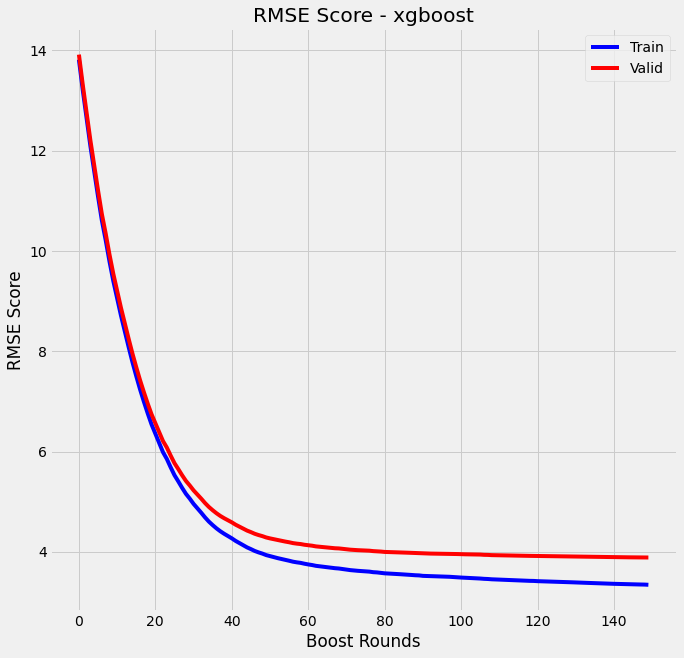

In [117]:
plt.figure(figsize=(10,10))

plt.plot(xg['history']['train']['rmse'], c='b', label='Train')
plt.plot(xg['history']['valid']['rmse'], c='r', label='Valid')

plt.legend()
plt.title('RMSE Score - xgboost')
plt.xlabel('Boost Rounds')
plt.ylabel('RMSE Score')
plt.show()

### Evaluation

In [91]:
deval = xgb.dask.DaskDMatrix(client, X_test)

In [92]:
y_test_pred=xgb.dask.predict(client, xg, deval).compute()

In [93]:
y_test_computed=y_test.compute()

In [94]:
xg_rmse=np.sqrt(mse(y_test_pred, da.from_array(y_test_computed)))
print("RMSE for xgboost Regression is ",xg_rmse)

RMSE for xgboost Regression is  3.8859284


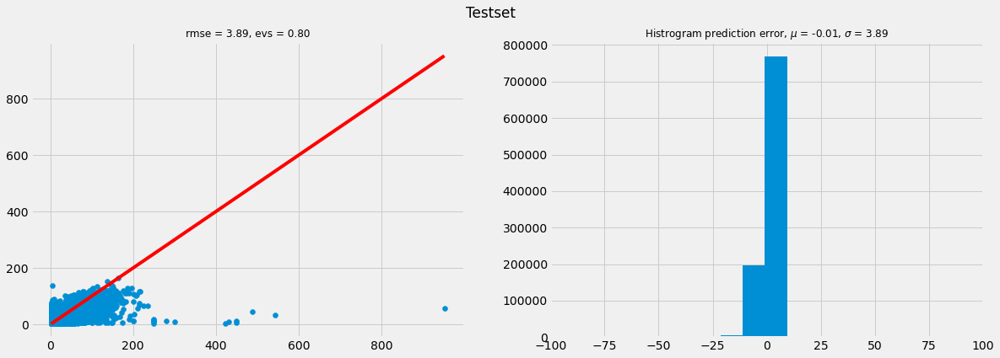

In [95]:
fig, axis = plt.subplots(1,2, figsize=(18,6))
fig.suptitle('Testset')

axis[0].scatter(y_test_computed, y_test_pred)
minimum = min(min(y_test_computed), min(y_test_pred))
maximum = max(max(y_test_computed), max(y_test_pred))
axis[0].plot([minimum, maximum], [minimum, maximum], c='r')

rmse=np.sqrt(mse(y_test_pred, y_test_computed))
evs=explained_variance_score(y_test_pred, y_test_computed)
axis[0].set_title('rmse = {:.2f}, evs = {:.2f}'.format(rmse, evs), size=12)

axis[1].hist(y_test_pred-y_test_computed, bins=100)
avg = np.mean(y_test_pred-y_test_computed)
std = np.std(y_test_pred-y_test_computed)
axis[1].set_xlim(xmin=-100, xmax=100)
axis[1].set_title('Histrogram prediction error, $\mu$ = {:.2f}, $\sigma$ = {:.2f}'.format(avg, std), size=12)

plt.show()

Plotting the first tree (GraphViz is needed)

In [106]:
#xgb.plot_tree(xg, num_trees=0)
#plt.rcParams['figure.figsize'] = [50,10]
#plt.show()

Plot the importance of every variable

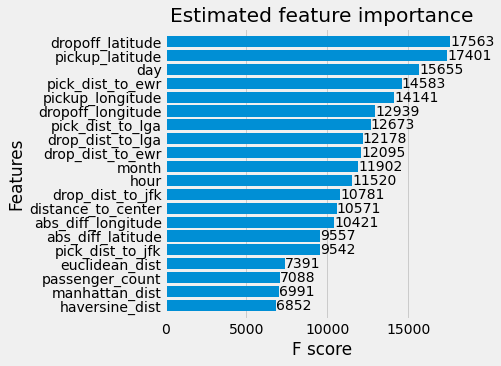

In [104]:
ax = xgb.plot_importance(xg['booster'], height=0.8, max_num_features=20)
ax.grid(False, axis="y")
ax.set_title('Estimated feature importance')
plt.show()

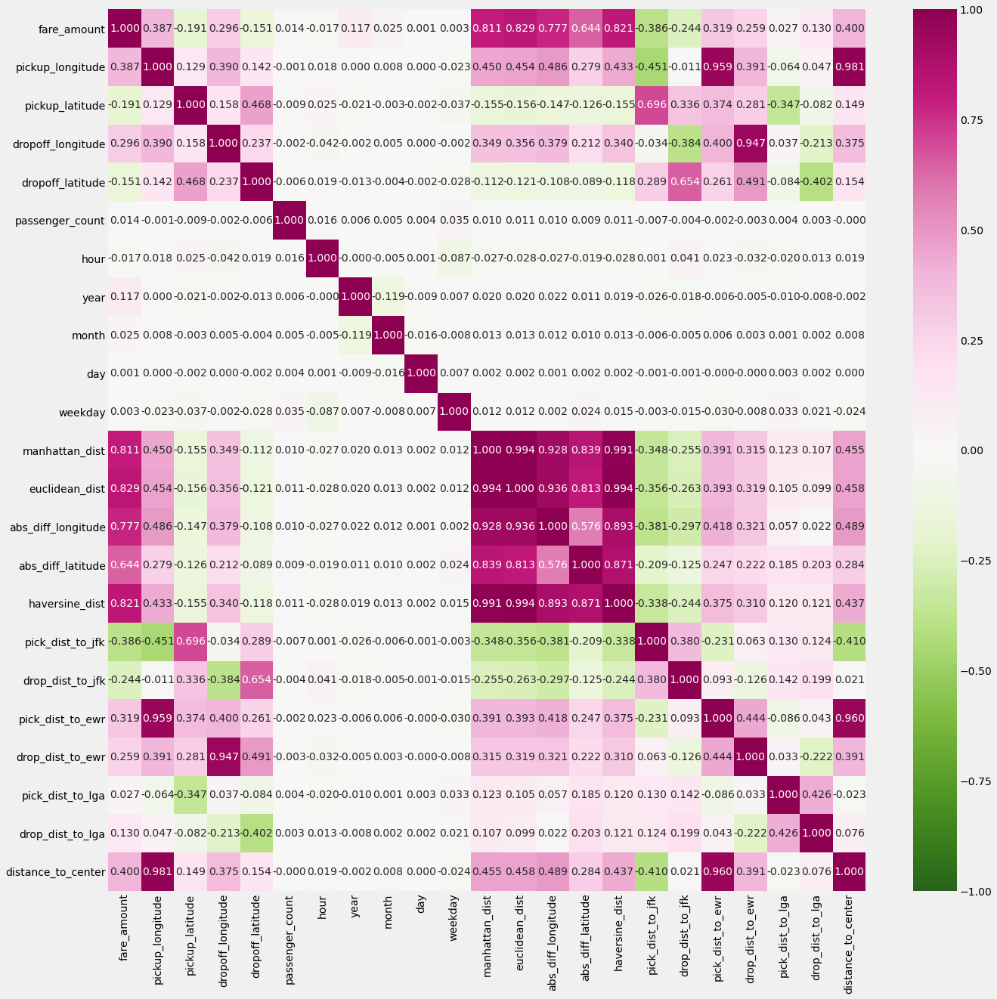

In [105]:
corrs=plot_df.corr()

plt.figure(figsize=(20,20))
sns.heatmap(corrs, annot=True, vmin=-1, vmax=1, fmt='.3f', cmap=plt.cm.PiYG_r)
plt.show()

#### Cross Validation

In [119]:
dtest = xgb.DMatrix(data=X_test.compute(), label=y_test.compute())

In [120]:
params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=dtest, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)

In [125]:
cv_results

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,13.273404,0.058008,13.274455,0.117195
1,12.120699,0.054265,12.122614,0.123240
2,11.131171,0.076617,11.134176,0.137848
3,10.219523,0.074311,10.223204,0.138119
4,9.416049,0.074557,9.421417,0.136777
5,8.734194,0.104801,8.739906,0.151193
6,8.164811,0.100578,8.172526,0.112081
7,7.629670,0.105995,7.638788,0.108347
8,7.148955,0.104893,7.161071,0.119696
9,6.717543,0.107703,6.731693,0.125329


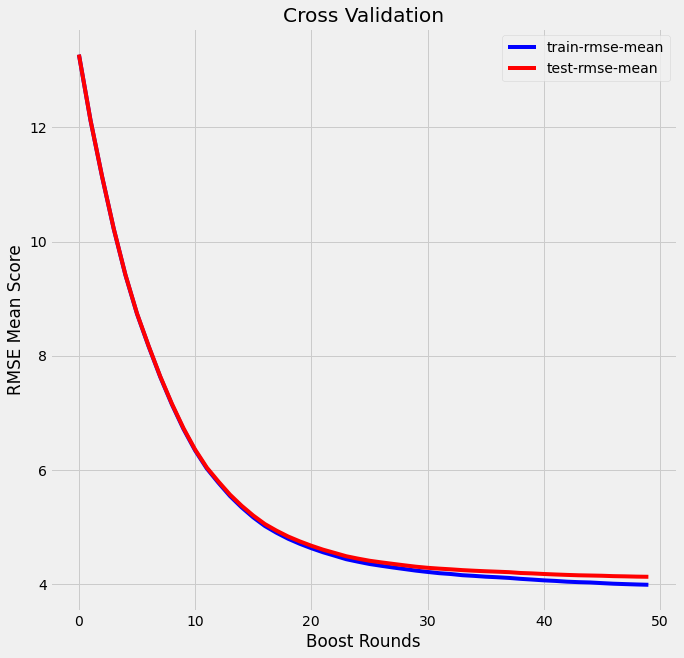

In [126]:
plt.figure(figsize=(10,10))

plt.plot(cv_results['train-rmse-mean'], c='b', label='train-rmse-mean')
plt.plot(cv_results['test-rmse-mean'], c='r', label='test-rmse-mean')

plt.legend()
plt.title('Cross Validation')
plt.xlabel('Boost Rounds')
plt.ylabel('RMSE Mean Score')
plt.show()

In [122]:
cv_results.tail()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
45,4.020338,0.090502,4.149405,0.202159
46,4.010050,0.089937,4.142530,0.203241
47,4.003233,0.091435,4.138911,0.202237
48,3.996720,0.091640,4.134077,0.202401
49,3.991153,0.090158,4.131208,0.203380


### Submission File
Create the submission file with the regressed fare_amount 

Read the test data file

In [84]:
test = dd.read_csv('Data/test.csv')

Add the same features as in the train dataset

In [85]:
test['key'] = test['key'].astype('datetime64[ns]')
test['pickup_datetime'] = test['pickup_datetime'].astype('datetime64[ns]')
test['pickup_longitude'] = test['pickup_longitude'].astype('float32')
test['pickup_latitude'] = test['pickup_latitude'].astype('float32')
test['dropoff_longitude'] = test['dropoff_longitude'].astype('float32')
test['dropoff_latitude'] = test['dropoff_latitude'].astype('float32')
test['passenger_count'] = test['passenger_count'].astype('int8')

test=add_features(test)

test['distance_to_center']=haversine_distance(NYC['lat'], NYC['lon'], test.pickup_latitude, test.pickup_longitude)

test=test.drop(['key', 'pickup_datetime', 'date', 'weekday_name'], axis=1)

Predict the fare amount

In [86]:
dpred = xgb.dask.DaskDMatrix(client, test)

In [87]:
y_pred=xgb.dask.predict(client, xg, dpred).compute()

Check for the correct length

In [88]:
if len(y_pred) != 9914:
    raise DatgaLengthError('Something went wrong. Not enough fare amounts were predicted.')

In [89]:
sub = pd.read_csv('Data/sample_submission.csv')

submission = pd.DataFrame()
submission['key']  = sub['key']
submission['fare_amount'] = y_pred
submission.to_csv('submission.csv', index = False)

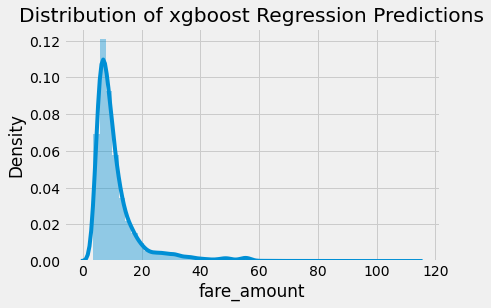

In [90]:
sns.distplot(submission['fare_amount'])
plt.title('Distribution of xgboost Regression Predictions')
plt.show()

## 4. Summary and Forecast

To get better results a gridsearch for the best hyper-parameters could be executed.  
Also some more features could be added. Like find some special days in the year where the fare could be a way higher. In addition, even more distances like to points of interest or most visited/popular hotels/places in nyc could be calculated. The Feature importance chart shows that dropoff and pickup locations are among the most important features.  
To improve the parallelization, a combination of RAPIDS and DASK could be useful in terms of computing speed. However, a distributed GPU network is needed for this.  
GPU on a single computer is fast, but does not provide enough memory to compute with all the data. After all, almost all datasets could be used with Dask. Even if there were problems with the cluster, which is why attempts were often interrupted and had to be restarted.  
An experiment with RAPIDS and DASK can be found in the [appendix: GPU Parallelism (RAPIDS + DASK)](#5.3.-GPU-Parallelism-(RAPIDS+DASK)) and [appendix: GPU Parallelism (RAPIDS)](#5.4.-GPU-Parallelism-(Only-RAPIDS)).

## 5. Appendix

### 5.1. Base Model
The base model was used for the first data explorations and tests with some regression algorithms. Later the important sequences were replaced by the corresponding dask components to use parallelism. 

In [ ]:
# import train data
df = pd.read_csv('Data/train.csv', nrows=15000000)

# import test data 
test = pd.read_csv('Data/test.csv')

In [ ]:
# convert some types
df['key'] = df['key'].astype('datetime64[ns]')
df['fare_amount'] = df['fare_amount'].astype('float32')
df['pickup_datetime'] = df['pickup_datetime'].astype('datetime64[ns]')
df['pickup_longitude'] = df['pickup_longitude'].astype('float32')
df['pickup_latitude'] = df['pickup_latitude'].astype('float32')
df['dropoff_longitude'] = df['dropoff_longitude'].astype('float32')
df['dropoff_latitude'] = df['dropoff_latitude'].astype('float32')
df['passenger_count'] = df['passenger_count'].astype('int8')

In [ ]:
# create boundary box with test data
min_lon = min(test.pickup_longitude.min(), test.dropoff_longitude.min())
max_lon = max(test.pickup_longitude.max(), test.dropoff_longitude.max())
min_lat = min(test.pickup_latitude.min(), test.dropoff_latitude.min())
max_lat = max(test.pickup_latitude.max(), test.dropoff_latitude.max())

boundary = {'min_lon': min_lon, 'max_lon': max_lon, 'min_lat': min_lat, 'max_lat': max_lat}

boundary

In [ ]:
# remove data with pickup or dropoff places outside the boundary box
df=df[((df.pickup_longitude >= boundary['min_lon'] ) & (df.pickup_longitude <= boundary['max_lon']) &
            (df.pickup_latitude >= boundary['min_lat']) & (df.pickup_latitude <= boundary['max_lat']) &
            (df.dropoff_longitude >= boundary['min_lon']) & (df.dropoff_longitude <= boundary['max_lon']) &
            (df.dropoff_latitude >=boundary['min_lat']) & (df.dropoff_latitude <= boundary['max_lat']))]

# remove some more outliers
df=df[df.fare_amount>=2.5]
df=df[df.passenger_count<=8]

In [ ]:
# define airports locations and constants for distance calculations

EARTH_RADIUS_IN_KM = 6371
KM_TO_MILES = 0.621371

# JFK airport coordinates, see https://www.travelmath.com/airport/JFK
JFK = {'lon': -73.7822222222, 'lat': 40.6441666667}

# Newark Liberty International Airport, see https://www.travelmath.com/airport/EWR
EWR = {'lon': -74.175, 'lat': 40.6897222222}

# LaGuardia Airport, see https://www.travelmath.com/airport/LGA
LGA = {'lon': -73.8719444444, 'lat': 40.7747222222}

In [ ]:
# method for haversine distance calculation in miles

def haversine_distance(lon1, lat1, lon2, lat2):
    
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to miles
    miles = KM_TO_MILES * EARTH_RADIUS_IN_KM * c
    
    return miles

In [ ]:
# extract and define some features

def add_features(df):
    df_copy = df.copy()
    
    df_copy['date'] = df_copy['pickup_datetime'].dt.date
    df_copy['hour'] = df_copy['pickup_datetime'].dt.hour
    df_copy['year'] = df_copy['pickup_datetime'].dt.year
    df_copy['month'] = df_copy['pickup_datetime'].dt.month
    df_copy['day'] = df_copy['pickup_datetime'].dt.day
    df_copy['weekday'] = df_copy['pickup_datetime'].dt.weekday
    df_copy['weekday_name'] = df_copy['pickup_datetime'].apply(lambda x: calendar.day_name[x.weekday()])
    
    # distance between pickup location and dropoff location
    df_copy['haversine_dist'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], df_copy['dropoff_longitude'], df_copy['dropoff_latitude'])
    
    # distance to jfk
    df_copy['pick_dist_to_jfk'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], JFK['lon'], JFK['lat'])
    df_copy['drop_dist_to_jfk'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], JFK['lon'], JFK['lat'])
    
    # distance to EWR
    df_copy['pick_dist_to_ewr'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], EWR['lon'], EWR['lat'])
    df_copy['drop_dist_to_ewr'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], EWR['lon'], EWR['lat'])
    
    # distance to EWR
    df_copy['pick_dist_to_lga'] = haversine_distance(df_copy['pickup_longitude'], df_copy['pickup_latitude'], LGA['lon'], LGA['lat'])
    df_copy['drop_dist_to_lga'] = haversine_distance(df_copy['dropoff_longitude'], df_copy['dropoff_latitude'], LGA['lon'], LGA['lat'])
    
    return df_copy

In [ ]:
df=add_features(df)

In [ ]:
# drop some unwanted features in the machine learning model
df=df.drop(['key', 'pickup_datetime', 'date', 'weekday_name'], axis=1)

In [ ]:
# create train and test data

y = df['fare_amount']
X = df.drop(['fare_amount'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [ ]:
# define, train and evaluate some machine learning models

# Linear Regression
lm = LinearRegression()
lm.fit(X_train.to_dask_array(),y_train)

y_pred=lm.predict(X_test.to_dask_array())
lm_rmse=np.sqrt(mean_squared_error(y_pred, y_test.to_dask_array().compute()))
print("RMSE for Linear Regression is ",lm_rmse)


# Random Forest
rf = RandomForestRegressor(max_features='sqrt', n_estimators=400, max_depth=8)
rf.fit(X_train,y_train)

y_pred=rf.predict(X_test)
rf_rmse=np.sqrt(mean_squared_error(y_pred, y_test))
print("RMSE for Random Forest is ",rf_rmse)


# xgboost Regressor
xg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 8, alpha = 10, n_estimators = 100)

xg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=True)

In [ ]:
# add features to test data
test['key'] = test['key'].astype('datetime64[ns]')
test['pickup_datetime'] = test['pickup_datetime'].astype('datetime64[ns]')
test['pickup_longitude'] = test['pickup_longitude'].astype('float32')
test['pickup_latitude'] = test['pickup_latitude'].astype('float32')
test['dropoff_longitude'] = test['dropoff_longitude'].astype('float32')
test['dropoff_latitude'] = test['dropoff_latitude'].astype('float32')
test['passenger_count'] = test['passenger_count'].astype('int8')

test=add_features(test)

test=test.drop(['key', 'pickup_datetime', 'date', 'weekday_name'], axis=1)

# create submission file
#y_pred=lm.predict(test)
#y_pred=rf.predict(test)
y_pred=xg.predict(test)

sub = pd.read_csv('Data/sample_submission.csv')

submission = pd.DataFrame()
submission['key']  = sub['key']
submission['fare_amount'] = y_pred
submission.to_csv('submission.csv', index = False)

### 5.2. Remaining dask models

With the linear regression from the dask_ml module, parallel calculations can be performed. 

In [ ]:
%%time
lm = LinearRegression()
lm.fit(X_train.to_dask_array(),y_train)

In [ ]:
y_pred=lm.predict(X_test.to_dask_array())
lm_rmse=np.sqrt(mean_squared_error(y_pred, y_test.to_dask_array().compute()))
print("RMSE for Linear Regression is ",lm_rmse)

#### xgb.dask.train
Another way to use the XGBRegressor.

In [ ]:
dtrain = xgb.dask.DaskDMatrix(client, X_train, y_train)

In [ ]:
dtest = xgb.dask.DaskDMatrix(client, X_test, y_test)

In [ ]:
watchlist = [(dtrain, 'train'), (dtest, 'valid')]

In [ ]:
params = {
    'learning_rate': 0.1,
    'max_depth': 8,
    'objective': 'reg:squarederror',
    'colsample_bytree': 0.3,
    'min_child_weight': 1,
    'gamma': 1,
    'silent': True,
    'verbose_eval': True,
    'booster' : 'gbtree',
    'eval_metric': 'rmse'
}
xg = xgb.dask.train(client, params, dtrain, num_boost_round=150, evals=watchlist, early_stopping_rounds=100, verbose_eval=100)

In [ ]:
dtest = xgb.dask.DaskDMatrix(client, test)
y_pred=xgb.dask.predict(client, xg['booster'], dtest).compute()

#### XGBRegressor ML Model
This version is normally designed for sequential models. But with the joblib module, dask can also use this regressor. 

In [ ]:
%%time
X_train_computed = X_train.compute() 

In [ ]:
%%time
y_train_computed = y_train.compute()

In [ ]:
%%time
X_test_computed = X_test.compute()

In [ ]:
%%time
y_test_computed = y_test.compute()

In [ ]:
%%time
xg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 8, alpha = 10, n_estimators = 100)

with joblib.parallel_backend('dask', scatter=[X_train_computed, y_train_computed, xg], n_jobs=-1):
    xg.fit(X_train_computed, y_train_computed, eval_set=[(X_train_computed, y_train_computed), (X_test_computed, y_test_computed)], verbose=True)

In [ ]:
test = dd.read_csv('Data/test.csv')

In [ ]:
test['key'] = test['key'].astype('datetime64[ns]')
test['pickup_datetime'] = test['pickup_datetime'].astype('datetime64[ns]')
test['pickup_longitude'] = test['pickup_longitude'].astype('float32')
test['pickup_latitude'] = test['pickup_latitude'].astype('float32')
test['dropoff_longitude'] = test['dropoff_longitude'].astype('float32')
test['dropoff_latitude'] = test['dropoff_latitude'].astype('float32')
test['passenger_count'] = test['passenger_count'].astype('int8')

test=add_features(test)

test['distance_to_center']=haversine_distance(NYC['lat'], NYC['lon'], test.pickup_latitude, test.pickup_longitude)

test=test.drop(['key', 'pickup_datetime', 'date', 'weekday_name'], axis=1)

In [ ]:
test_computed = test.compute()

In [ ]:
y_pred = xg.predict(test_computed)

#### Random Forest
Since there is no random forest regressor designed for dask, the normal one form the sklearn module is used. Additionally, as with the XGBRegressor, the joblib module must also be used. For better results a gridsearch could be executed to get the best params for random forest. 

In [ ]:
%%time

with joblib.parallel_backend('dask'):
    rf = RandomForestRegressor(max_features='sqrt', n_estimators=100, max_depth=8)
    rf.fit(X_train,y_train)

In [ ]:
y_pred=rf.predict(X_test.to_dask_array())
y_pred = da.from_array(y_pred)
rf_rmse=np.sqrt(mean_squared_error(y_pred, y_test.to_dask_array().compute()))
print("RMSE for Random Forest is ",rf_rmse)

### 5.3. GPU Parallelism (RAPIDS+DASK) 
Not all data could be processed with the GPU Parallelism Model due to insufficient memory space.  
Source orientation for GPU parallelization with RAPIDS: \[[10](https://github.com/allenkong221/nyc-taxi-fare-prediction/blob/main/nyc-taxi-fare-rapids-dask-gpu.ipynb)\]

In [ ]:
cluster = LocalCUDACluster(n_workers=1)
client = Client(cluster)

client.restart()

In order to not read in all data, it is best to split the csv file into smaller files of the desired  size.

In [ ]:
df = dask_cudf.read_csv('Data/train.csv')

In [ ]:
df['pickup_datetime'] = df['pickup_datetime'].astype('datetime64[ns]')

In [ ]:
query = (
    ' fare_amount >= 2.5',
    ' and 0 < passenger_count <= 6',
    ' and -74.263242 <= pickup_longitude <= -72.986532',
    ' and -74.263242 <= dropoff_longitude <= -72.986532',
    ' and 40.568973 <= pickup_latitude <= 41.709555',
    ' and 40.568973 <= dropoff_latitude <= 41.709555'
)

In [ ]:
df = (df
     .dropna()
     .query(query))

In [ ]:
def add_features(df):
    df['date'] = df['pickup_datetime'].dt.date
    df['hour'] = df['pickup_datetime'].dt.hour
    df['year'] = df['pickup_datetime'].dt.year
    df['month'] = df['pickup_datetime'].dt.month
    df['day'] = df['pickup_datetime'].dt.day
    df['weekday'] = df['pickup_datetime'].dt.weekday
    df['weekday_name'] = df['pickup_datetime'].apply(lambda x: calendar.day_name[x.weekday()])
    
    # distance between pickup location and dropoff location
    df = df.apply_rows(haversine_distance, incols=['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude'], 
                      outcols=dict(haversine_distance=np.float32), kwargs=dict())
    
    df = df.drop(['key', 'pickup_datetime', 'weekday_name', 'date'], axis=1)
    
    return df

In [ ]:
parts = [dask.delayed(add_features)(part) for part in df.to_delayed()]
df = dask_cudf.from_delayed(parts)

In [ ]:
y = df['fare_amount']
X = df.drop(['fare_amount'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [ ]:
%%time
dtrain = xgb.dask.DaskDMatrix(client, X_train, y_train)
dvalid = xgb.dask.DaskDMatrix(client, X_test, y_test)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

params = {
    'learning_rate': 0.1,
    'max_depth': 11,
    'objective': 'reg:squarederror',
    'colsample_bytree': 0.3,
    'min_child_weight': 1,
    'silent': True,
    'verbose_eval': True,
    'booster' : 'gbtree',
    'eval_metric': 'rmse',
    'tree_method':'gpu_hist',
    'n_gpus': 1
}

trained_model = xgb.dask.train(client, params, dtrain, num_boost_round=150, evals=watchlist, early_stopping_rounds=100, verbose_eval=1)

In [ ]:
test = dask_cudf.read_csv('Data/test.csv')

test['pickup_datetime'] = test['pickup_datetime'].astype('datetime64[ns]')

tparts = [dask.delayed(add_features)(part) for part in test.to_delayed()]
test = dask_cudf.from_delayed(tparts)

In [ ]:
dtest = xgb.dask.DaskDMatrix(client, test)
prediction = xgb.dask.predict(client, trained_model['booster'], dtest)
y_pred = prediction.compute()

sub = pd.read_csv('Data/sample_submission.csv')

submission = pd.DataFrame()
submission['key']  = sub['key']
submission['fare_amount'] = y_pred
submission.to_csv('submission.csv', index = False)

### 5.4. GPU Parallelism (Only RAPIDS) 
There was also a try with a single GPU without DASK. It's basically the same solution as shown in [5.3](#5.3.-GPU-Parallelism-(RAPIDS+DASK)).   
It's just without a LocalCUDA Cluster, but with the "cudf"-Module.  
Here it's necessary to say, the Memory of one available GPU is not enough to handle the whole dataset, so it's just possible to use this variation with ~5M-10M rows. A higher amount of rows resulted in an out of memory error. 

## 6. Sources 

$^{1}$ https://www.kaggle.com/breemen/nyc-taxi-fare-data-exploration  
$^{2}$ https://www.kaggle.com/willkoehrsen/a-walkthrough-and-a-challenge  
$^{3}$ https://www.kaggle.com/dster/nyc-taxi-fare-starter-kernel-simple-linear-model  
$^{4}$ https://www.kaggle.com/shaz13/simple-exploration-notebook-map-plots-v2  
$^{5}$ https://www.introducingnewyork.com/taxis#:~:text=Minimum%20fare%3A%20US%24%202.50.,City%20taxes%3A%20US%24%200.50  
$^{6}$ https://www.openstreetmap.org/export#map=12/40.7250/-73.8999  
$^{7}$ https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png  
$^{8}$ https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png  
$^{9}$ https://www.kite.com/python/answers/how-to-find-the-distance-between-two-lat-long-coordinates-in-python  
$^{10}$ https://github.com/allenkong221/nyc-taxi-fare-prediction/blob/main/nyc-taxi-fare-rapids-dask-gpu.ipynb  